#  Finding Lane Lines on the Road

https://github.com/naokishibuya/car-finding-lane-lines

## Techniques:
- Color Selection
- Canny Edge Detection
- Region of Interests Selection
- Hough Transform Line Detection

In [37]:
import matplotlib.pyplot as plt
import cv2
import os, glob
import numpy as np
from moviepy.editor import VideoFileClip

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

%matplotlib inline С помощью этого бэкэнда вывод команд построения отображается в виде строки внутри интерфейсов, таких как блокнот Jupyter, непосредственно под кодовым элементом, который его создал. Полученные графики также будут сохранены в документе ноутбука.

# Show Test images

In [38]:
# Function show_image is used to display images 
def show_image(images, cmap= None):
    cols = 2
    rows = (len(images)+1)//cols
    
    plt.figure(figsize = (10,11))
    # enumerate(images) Позволяет избавиться от необходимости инициализировать и обновлять отдельную переменную-счётчик
    for i, image in enumerate(images):
        plt.subplot(rows,cols,i+1)
        # use gray scale color map if there is only one channel
        cmap = 'gray' if len(image.shape)==2 else cmap
        plt.imshow(image,cmap = cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad = 0, h_pad = 0, w_pad = 0)
    plt.show()
        
    

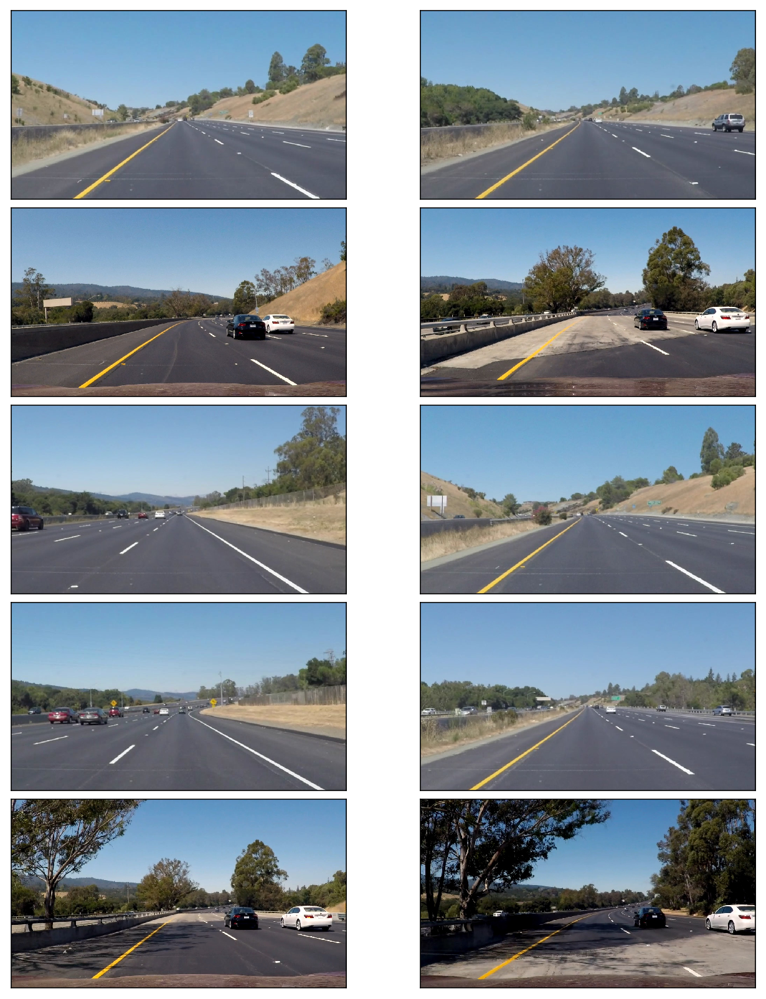

In [39]:
test_images = [plt.imread(path) for path in glob.glob('test_images/*.jpg')]

show_image(test_images)

# Color Selection

## RGB Color Space

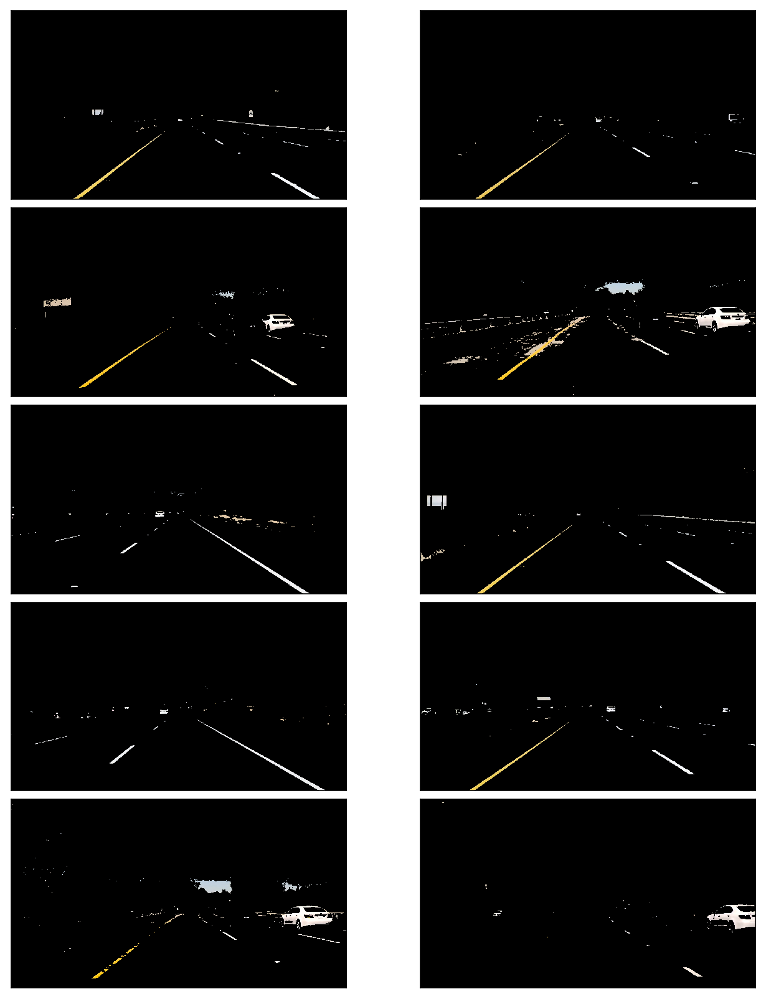

In [40]:
# Try to selecting only yellow and white colors using RGB channels
def select_rgb_white_yellow(image):
    
    # white color mask
    lower = np.uint8([200,200,200])
    upper = np.uint8([255,255,255])
    white_mask = cv2.inRange(image, lower, upper)
    
    #yellow color mask
    lower = np.uint8([190,190,0])
    upper = np.uint8([255,255,255])
    yellow_mask = cv2.inRange(image, lower, upper)
    
    #combine masks
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    
    return cv2.bitwise_and(image, image, mask=mask)

show_image(list(map(select_rgb_white_yellow, test_images)))

There is a shade from the tree

## HSL and HSV Color 

Source: https://commons.wikimedia.org/wiki/File:Hsl-hsv_models.svg

## HSV Color Space

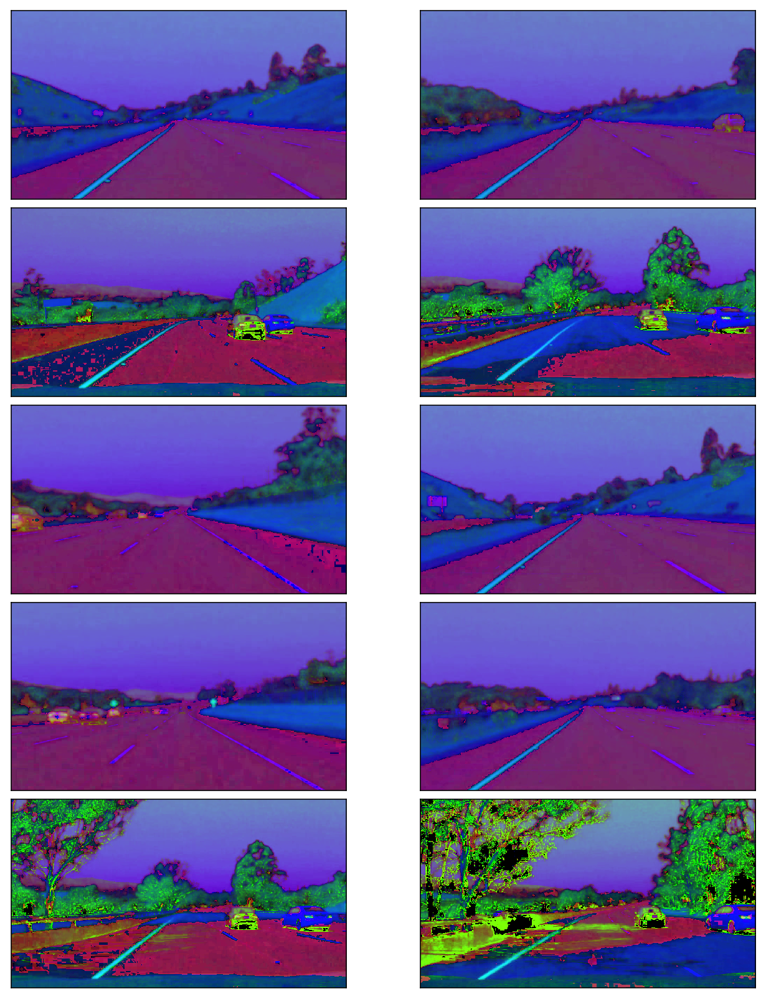

In [41]:
def convert_hsv(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

show_image(list(map(convert_hsv,test_images)))

## HSL Color Space

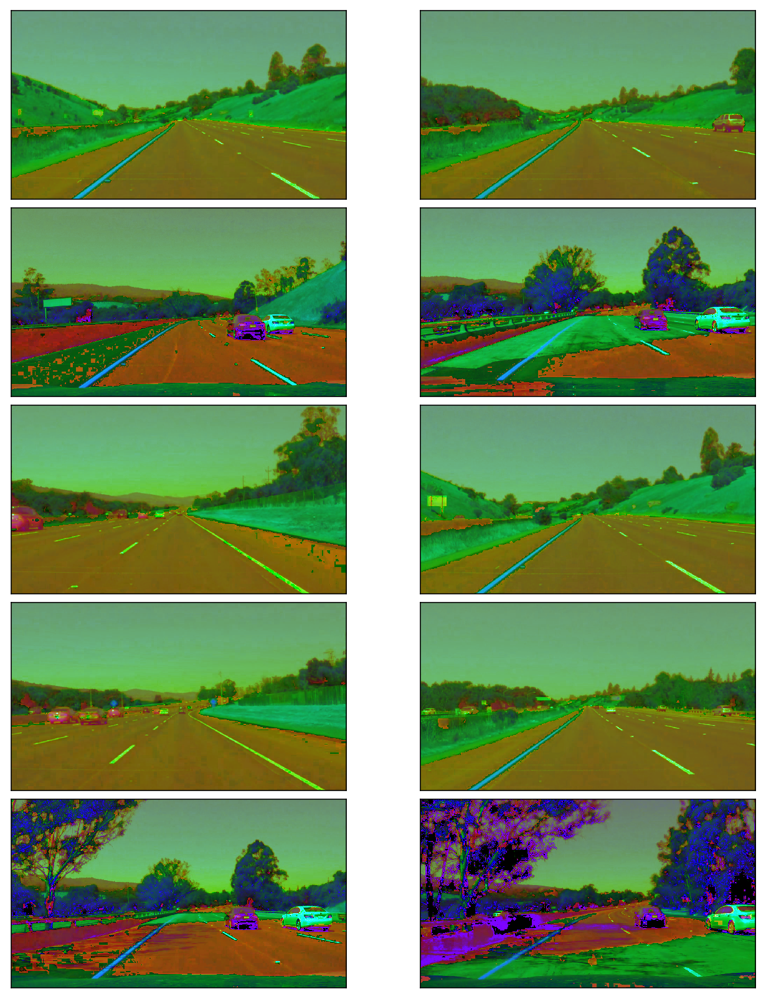

In [42]:
def convert_hls(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

show_image(list(map(convert_hls,test_images)))

In this color spaces lines are clean.

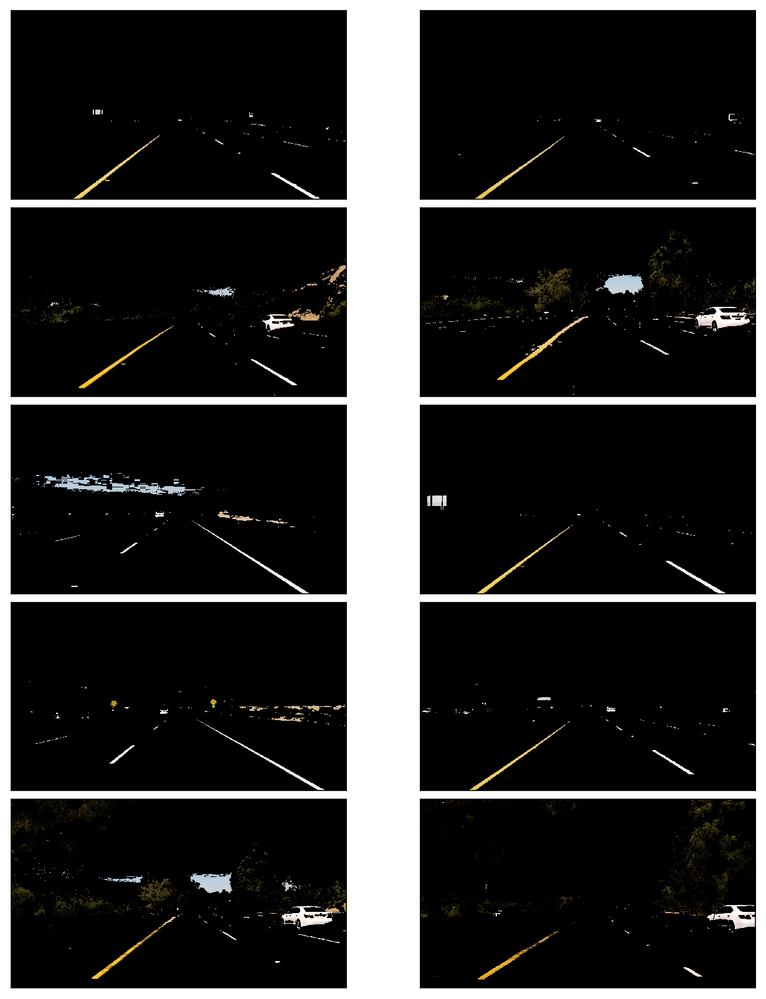

In [43]:
def select_white_yellow(image):
    converted = convert_hls(image)
    
    #white color mask
    lower = np.uint8([0,200,0])
    upper = np.uint8([255,255,255]) 
    white_mask = cv2.inRange(converted,lower,upper)
    
    #yellow color mask
    lower = np.uint8([10,0,100])
    upper = np.uint8([40,255,255]) 
    yellow_mask = cv2.inRange(converted,lower,upper)
    
    #combine the mask
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    
    return cv2.bitwise_and(image, image, mask = mask)

white_yellow_images = list(map(select_white_yellow,test_images))

show_image(white_yellow_images)

The combined mask filters the yellow and white lines very clearly.

# Canny Edge Detection

We want to detect edges in order to find straight lines especially lane lines. For this,

- use cv2.cvtColor to convert images into gray scale
- use cv2.GaussianBlur to smooth out rough edges
- use cv2.Canny to find edges

## Gray Scaling

Convert images into gray scale for edge detection.

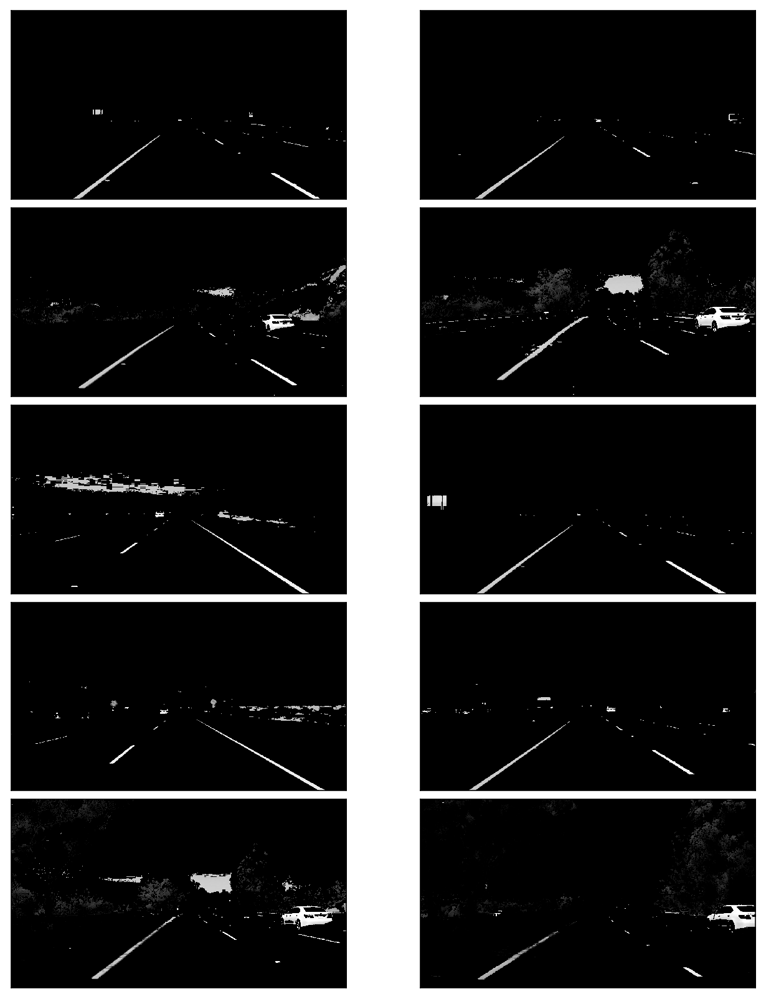

In [44]:
def convert_gray_scale(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

gray_images = list(map(convert_gray_scale, white_yellow_images))
show_image(gray_images)

## Gaussian Smoothing

When there is an edge (i.e. a line), the pixel intensity changes rapidly (i.e. from 0 to 255) which we want to detect. But before doing so, we should make the edges smoother. As you can see, the above images have many rough edges which causes many noisy edges to be detected.

I use cv2.GaussianBlur to smooth out edges.

In [45]:
def apply_smoothing(image, kernel_size =15):
    # kernel_size must be postivie and odd
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

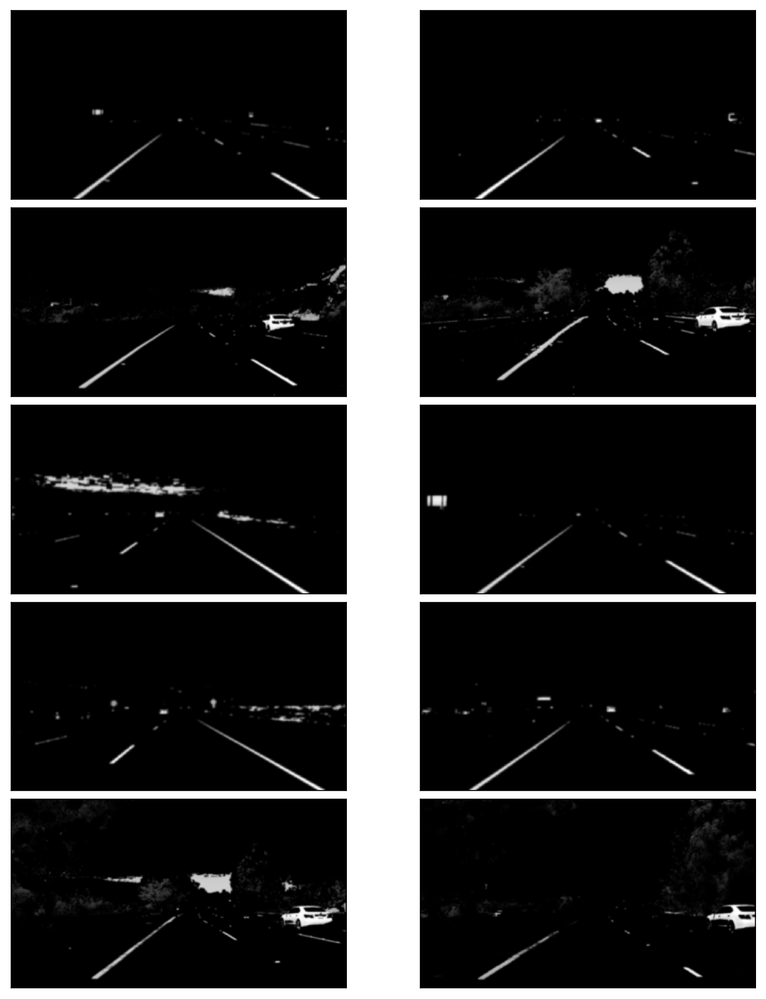

In [46]:
blurred_images = list(map(lambda image: apply_smoothing(image), gray_images))

show_image(blurred_images)

## Edge Detection

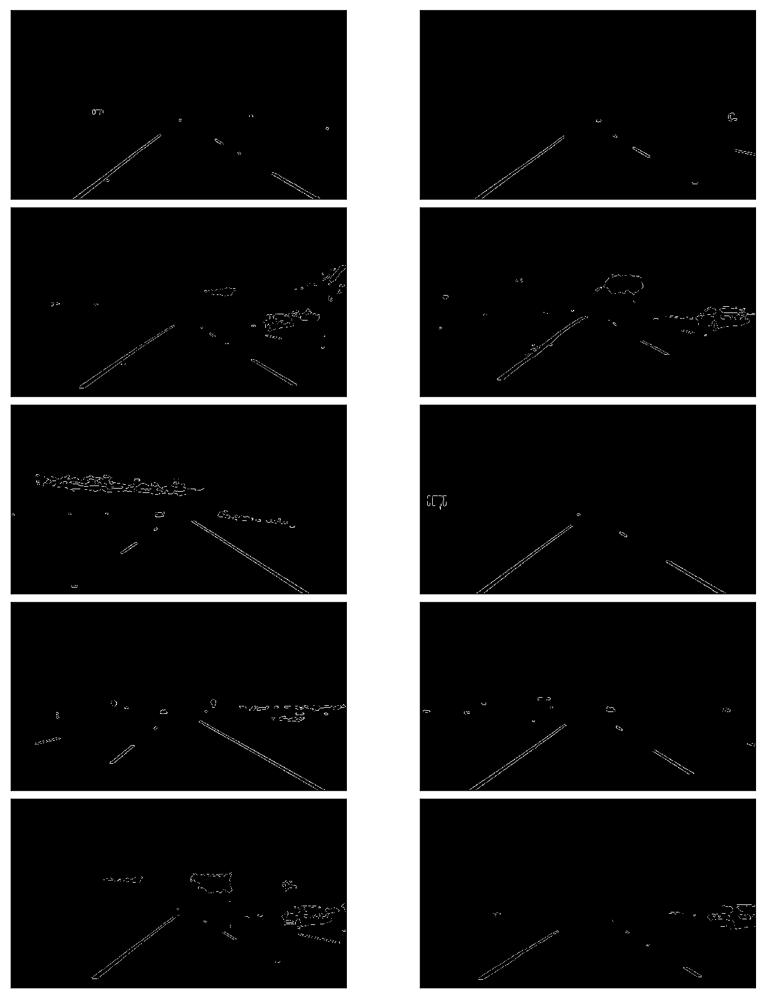

In [47]:
def detect_edges(image, low_treshold =50, high_treshold =150):
    return cv2.Canny(image, low_treshold, high_treshold)

edge_images = list(map(lambda image: detect_edges(image), blurred_images))

show_image(edge_images)

## Region of Interest Selection

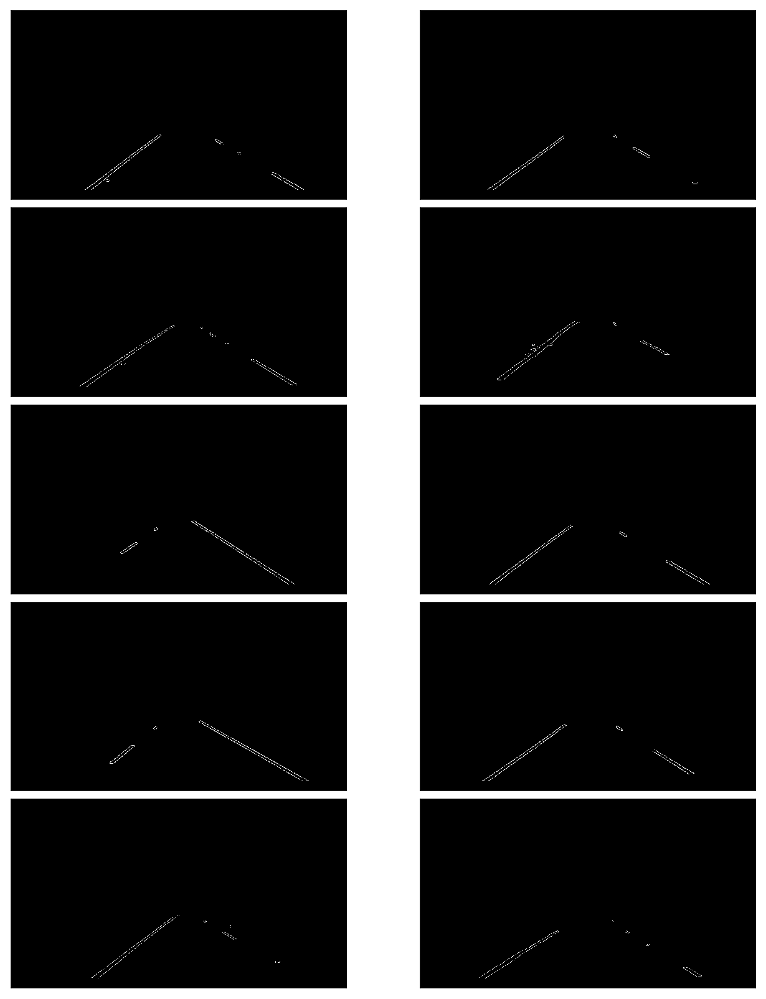

In [48]:

def filter_region(image, vertices):
    
    mask = np.zeros_like(image)
    if len(mask.shape)==2:
        cv2.fillPoly(mask, vertices, 255)
    else:
        cv2.fillPoly(mask, vertices, (255,)*mask.shape[2]) # in case, the input image has a channel dimension        
    return cv2.bitwise_and(image, mask)

    
def select_region(image):
    # first, define the polygon by vertices
    rows, cols   = image.shape[:2]
    bottom_left  = [cols*0.1, rows*0.95]
    top_left     = [cols*0.4, rows*0.6]
    bottom_right = [cols*0.9, rows*0.95]
    top_right    = [cols*0.6, rows*0.6] 
    
    # the vertices are an array of polygons (i.e array of arrays) and the data type must be integer
    vertices = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    return filter_region(image, vertices)


# images showing the region of interest only
roi_images = list(map(select_region, edge_images))

show_image(roi_images)

## Hough Transform Line Detection

I'm using cv2.HoughLinesP to detect lines in the edge images.

There are several parameters you'll need to tweak and tune:

- rho – Distance resolution of the accumulator in pixels.
- theta – Angle resolution of the accumulator in radians.
- threshold – Accumulator threshold parameter. Only those lines are returned that get enough votes (> threshold).
- minLineLength – Minimum line length. Line segments shorter than that are rejected.
- maxLineGap – Maximum allowed gap between points on the same line to link them.

In [49]:
def hough_lines(image):
    return cv2.HoughLinesP(image, rho=1, theta=np.pi/180, threshold=20, minLineLength=20, maxLineGap=300)


list_of_lines = list(map(hough_lines, roi_images))

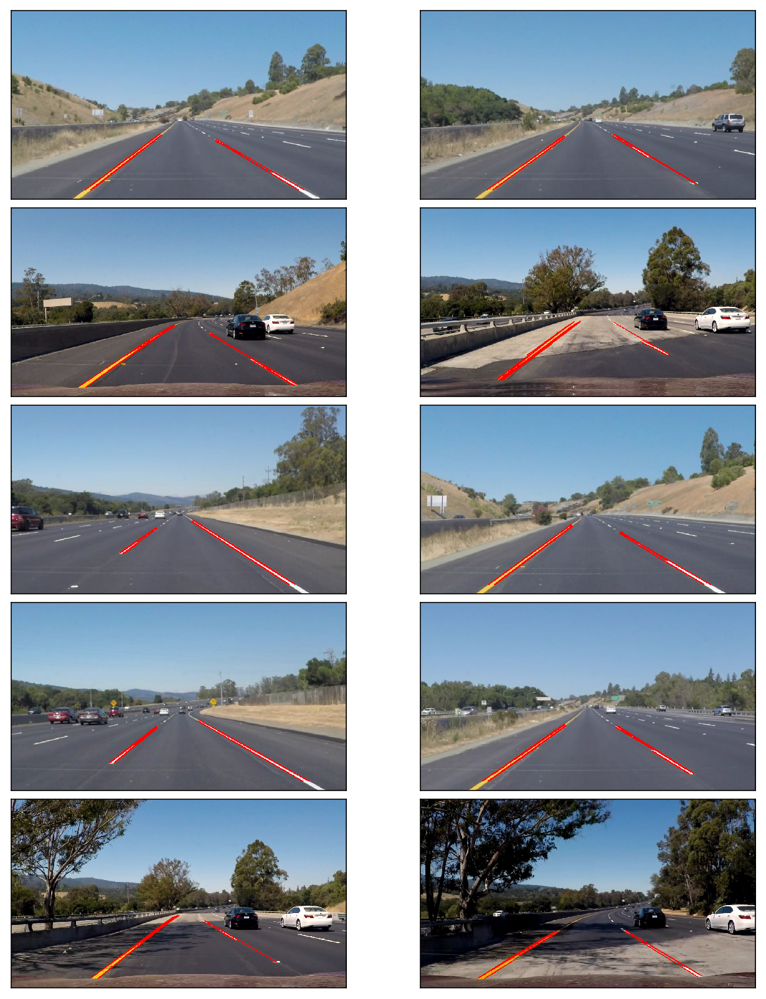

In [50]:
def draw_lines(image, lines, color = [255, 0, 0], thickness = 2, make_copy = True):
    # the lines returned by cv2.HoughLinesP has the shape (-1, 1, 4)
    if make_copy:
        image = np.copy(image) # don't want to modify the original
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(image, (x1, y1), (x2, y2), color, thickness)
    return image


line_images = []
for image, lines in zip(test_images, list_of_lines):
    line_images.append(draw_lines(image, lines))
    
show_image(line_images)